---
title: "Enet-Camvid"
author: "[GeekyRakshit](../)"
date: "2020-05-05"
categories: [computervision, deeplearning, keras, python, tensorflow]
description: "Pytorch Implementation of ENet: A Deep Neural Network Architecture for Real-Time Semantic Segmentation trained on the CamVid Dataset"
image: "./assets/enet-camvid.png"
freeze: true
execute:
  warning: false
---

**Project Repository:** [https://github.com/soumik12345/enet](https://github.com/soumik12345/enet)

## Network Architecture

In [ ]:
# Imports for Model Creation
import torch
from torch.nn import functional as F
from torch.nn import (
	Module, Conv2d, ReLU, PReLU, Dropout2d, AvgPool2d,
	Upsample, MaxPool2d, Sequential, MaxUnpool2d,
	BatchNorm2d, AdaptiveAvgPool2d, ConvTranspose2d
)
from IPython.display import SVG

### Activation Module

Inspired by **Swish** Activation Function (Paper), **Mish** is a Self Regularized Non-Monotonic Neural Activation Function. Mish Activation Function can be mathematically represented by the following formula:

$f(x) = x * tanh(ln(1 + e^{x}))$

It can also be represented using the **Softplus** Activation Function:
$f(x) = x * tanh( \varsigma (x))$

where, $\varsigma (x)  = ln(1 + e^{x})$

In [ ]:
class Mish(Module):

	def __init(self):
		super().__init__()
	
	def forward(self, input):
		return input * torch.tanh(F.softplus(input))

Since Pytorch does not explicitly have any Module for Activation unlike Tensorflow, we can easily implement it. The following Module could be modified to incorporate for any number of activation functions, each of which can be accessed with a string label.

In [ ]:
class Activation(Module):
	
	def __init__(self, name='relu'):
		super().__init__()
		self.name = name
		if name == 'relu':
			self.act = ReLU()
		elif name == 'prelu':
			self.act = PReLU()
		elif name == 'mish':
			self.act = Mish()

	def forward(self, input):
		return self.act(input)

### Enet Initial Block

The Initial Block is the first block of the Enet Model. It consists of 2 branches, a convolutional layer (`out_channels=13, kernel_size=3, stride=2`) which we would call the main branch in our implementation and a MaxPooling layer which is performed with non-overlapping 2x2 windows which is a secondary block. We would perform BatchNormalization and a Non-linear Activation on the concatenation of the two branches. The Input block would have 16 output channels.

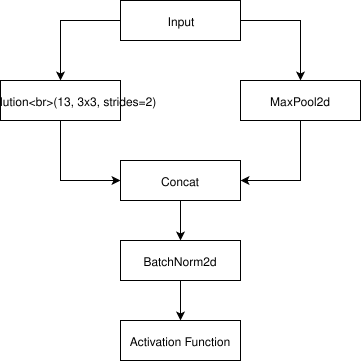

In [7]:
#collapse-hide
SVG('enet_initial_block_xc7itf.svg')

In [ ]:
class InitialBlock(Module):
	
	def __init__(self, in_channels, out_channels, bias=False, activation='relu'):
		super().__init__()
		self.main_branch = Conv2d(
			in_channels, out_channels - 3,
			kernel_size=3, stride=2,
			padding=1, bias=bias
		)
		self.secondary_branch = MaxPool2d(3, stride=2, padding=1)
		self.batch_norm = BatchNorm2d(out_channels)
		self.activation = Activation(activation)

	def forward(self, x):
		main = self.main_branch(x)
		secondary = self.secondary_branch(x)
		output = torch.cat((main, secondary), 1)
		output = self.batch_norm(output)
		output = self.activation(output)
		return output

### Regular Bottleneck Block

In case of the Regular Bottleneck Block which is the most widely used block in the ENet architecture, the secondary block has no operations. The middle convolution blocks are either `3x3` regular convolutional block or a `5x5` asymmetric convolutional block. All the convolutional blocks in the main branch have Batchnormalization and respective Activation after them. The main branch is regularized by a Dropout operation.

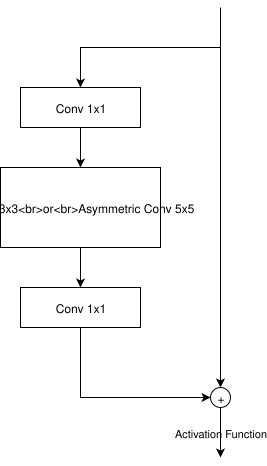

In [9]:
#collapse-hide
SVG('enet_regular_bottleneck_esc4ir.svg')

In [ ]:
class RegularBottleneckBlock(Module):

	def __init__(
		self, channels, internal_ratio=4, kernel_size=3, padding=0,
		dilation=1, asymmetric=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = channels // internal_ratio
		
		### Main Branch ###
		
		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				channels, internal_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2
		if asymmetric:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(kernel_size, 1), stride=1,
					padding=(padding, 0), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(1, kernel_size), stride=1,
					padding=(0, padding), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		else:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=kernel_size, stride=1,
					padding=padding, dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		
		# Block 3 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(channels),
			Activation(activation),
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	
	def forward(self, x):
		secondary_branch = x
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		main_branch = self.dropout(main_branch)
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

### Downsample Bottleneck Block

This block is used in the Encoder stages of the Enet Architecture. In this block, the main branch is `Conv 1x1 -> Conv 3x3 -> Conv 1x1 -> Dropout`. The secondary branch consists of a Maxpooling operation performed with non-overlapping 2x2 windows.

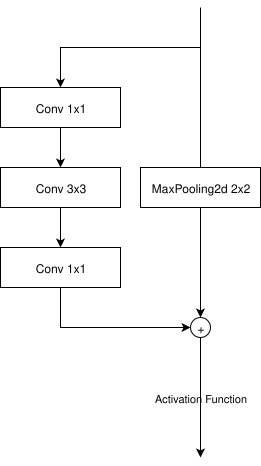

In [11]:
#collapse-hide
SVG('enet_downsampling_bottleneck-1_ysayci.svg')

In [ ]:
class DownsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels, internal_ratio=4,
		return_indices=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio
		self.return_indices = return_indices

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=2, stride=2, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 3x3
		self.main_conv_block_2 = Sequential(
			Conv2d(
				internal_channels, internal_channels,
				kernel_size=3, stride=1, padding=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_maxpool = MaxPool2d(
			2, stride=2,
			return_indices=return_indices
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x):
		# Main Branch
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		# Secondary Branch
		if self.return_indices:
			secondary_branch, max_indices = self.secondary_maxpool(x)
		else:
			secondary_branch = self.secondary_maxpool(x)
		# Padding
		n, ch_main, h, w = main_branch.size()
		ch_sec = secondary_branch.size()[1]
		padding = torch.zeros(n, ch_main - ch_sec, h, w)
		if secondary_branch.is_cuda:
			padding = padding.cuda()
		# Concatenate
		secondary_branch = torch.cat((secondary_branch, padding), 1)
		output = secondary_branch + main_branch
		output = self.activation(output)
		if self.return_indices:
			return output, max_indices
		else:
			return output

### Upsampling Bottleneck Block

This block is used in the Decoder stages of the Enet Architecture. In this block, the main branch is `Conv 1x1 -> ConvTranspose2d 3x3 -> Conv 1x1 -> Dropout`. The Secondary branch consists of `Conv 1x1` block followed by a `MaxUnpooling2d` (Inverse of MaxPooling2d) Block.

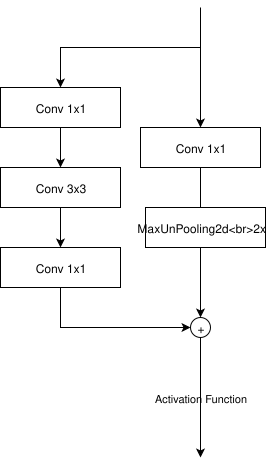

In [13]:
#collapse-hide
SVG('enet_upsampling_block_du1lmw.svg')

In [ ]:
class UpsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels,
		internal_ratio=4, dropout_prob=0,
		bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_branch_conv_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Transposed Convolution
		self.main_branch_transpose_conv_2 = ConvTranspose2d(
			internal_channels, internal_channels,
			kernel_size=2, stride=2, bias=bias
		)
		self.main_branch_bn_2 = BatchNorm2d(internal_channels)
		self.main_branch_act_2 = Activation(activation)

		# Block 3 Conv 1x1
		self.main_branch_conv_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_conv = Sequential(
			Conv2d(
				in_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels)
		)
		self.secondary_unpool = MaxUnpool2d(kernel_size=2)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x, max_indices, output_size):
		# Main Branch
		main_branch = self.main_branch_conv_1(x)
		main_branch = self.main_branch_transpose_conv_2(main_branch, output_size=output_size)
		main_branch = self.main_branch_bn_2(main_branch)
		main_branch = self.main_branch_act_2(main_branch)
		main_branch = self.main_branch_conv_3(main_branch)
		main_branch = self.dropout(main_branch)
		# Secondary Branch
		secondary_branch = self.secondary_conv(x)
		secondary_branch = self.secondary_unpool(
			secondary_branch, max_indices,
			output_size=output_size
		)
		# Concatenate
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

### Building Enet

The overall architecture of Enet is summarized in the following table. The whole architecture is divided into 6 parts or stages. Stage `0` consists of the Initial Block only. Stages `1-3` make up the encoder part of the network which downsamples the input. Stages `4-5` makes up the decoder, which upsamples the input to create the output.

|Name|Type|Output Size|
|---	|---	|---	|
|Initial|   	|`16x256x256`|
|-------|-------|-------|
|Bottleneck_1|Downsampling|`64x128x128`|
|RegularBottleneck_1_1|   	|`64x128x128`|
|RegularBottleneck_1_2|   	|`64x128x128`|
|RegularBottleneck_1_3|   	|`64x128x128`|
|RegularBottleneck_1_4|   	|`64x128x128`|
|-------|-------|-------|
|Bottleneck_2|Downsampling|`128x64x64`|
|RegularBottleneck_2_1|   	|`128x64x64`|
|RegularBottleneck_2_2|Dilated 2|`128x64x64`|
|RegularBottleneck_2_3|Asymmetric 5|`128x64x64`|
|RegularBottleneck_2_4|Dilated 4|`128x64x64`|
|RegularBottleneck_2_5|   	|`128x64x64`|
|RegularBottleneck_2_6|Dilated 8|`128x64x64`|
|RegularBottleneck_2_7|Asymmetric 5|`128x64x64`|
|RegularBottleneck_2_8|Dilated 16|`128x64x64`|
|-------|-------|-------|
|RegularBottleneck_3|   	|`128x64x64`|
|RegularBottleneck_3_1|Dilated 2|`128x64x64`|
|RegularBottleneck_3_2|Assymetric 5|`128x64x64`|
|RegularBottleneck_3_3|Dilated 4|`128x64x64`|
|RegularBottleneck_3_4|   	|`128x64x64`|
|RegularBottleneck_3_5|Dilated 8|`128x64x64`|
|RegularBottleneck_3_6|Asymmetric 5|`128x64x64`|
|RegularBottleneck_3_7|Dilated 16|`128x64x64`|
|-------|-------|-------|
|Bottleneck_4|Upsampling|`64x128x128`|
|Bottleneck_4_1|   	|`64x128x128`|
|Bottleneck_4_2|   	|`64x128x128`|
|-------|-------|-------|
|Bottleneck_5|Upsampling|`16x256x256`|
|Bottleneck_5_1|   	|`16x256x256`|
|-------|-------|-------|
|Transposed_Conv|   	|`Cx512x512`|

In [ ]:
class Enet(Module):

	def __init__(self, num_classes, encoder_activation='mish', decoder_activation='relu'):
		
		super().__init__()
		
		# Initial Block
		self.initial_block = InitialBlock(3, 16, activation=encoder_activation)
		
		### Encoding Stages ###

		# Stage 1
		self.down_bottleneck_1 = DownsampleBottleneckBlock(
			16, 64, return_indices=True,
			dropout_prob=0.01, activation=encoder_activation
		)
		self.bottleneck_1_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_3 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_4 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)

		# Stage 2
		self.down_bottleneck_2 = DownsampleBottleneckBlock(
			64, 128, return_indices=True,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_1 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_2 = RegularBottleneckBlock(
			128, dilation=2,
			padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_3 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_4 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_5 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_6 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_7 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_8 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 3
		self.regular_bottleneck_3 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_1 = RegularBottleneckBlock(
			128, dilation=2, padding=2,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_2 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_3 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_4 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_5 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_6 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_7 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 4
		self.upsample_4 = UpsampleBottleneckBlock(
			128, 64, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)

		# Stage 5
		self.upsample_5 = UpsampleBottleneckBlock(
			64, 16, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_5 = RegularBottleneckBlock(
			16, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.transposed_conv = ConvTranspose2d(
			16, num_classes, kernel_size=3,
            stride=2, padding=1, output_padding=1, bias=False
		)

	def forward(self, x):
		# Initial Block
		input_size = x.size()
		x = self.initial_block(x)
		# Stage 1
		input_size_1 = x.size()
		x, max_indices_1 = self.down_bottleneck_1(x)
		x = self.bottleneck_1_1(x)
		x = self.bottleneck_1_2(x)
		x = self.bottleneck_1_3(x)
		x = self.bottleneck_1_4(x)
		# Stage 2
		input_size_2 = x.size()
		x, max_indices_2 = self.down_bottleneck_2(x)
		x = self.bottleneck_2_1(x)
		x = self.bottleneck_2_2(x)
		x = self.bottleneck_2_3(x)
		x = self.bottleneck_2_4(x)
		x = self.bottleneck_2_5(x)
		x = self.bottleneck_2_6(x)
		x = self.bottleneck_2_7(x)
		x = self.bottleneck_2_8(x)
		# Stage 3
		x = self.regular_bottleneck_3(x)
		x = self.bottleneck_3_1(x)
		x = self.bottleneck_3_2(x)
		x = self.bottleneck_3_3(x)
		x = self.bottleneck_3_4(x)
		x = self.bottleneck_3_5(x)
		x = self.bottleneck_3_6(x)
		x = self.bottleneck_3_7(x)
		# Stage 4
		x = self.upsample_4(x, max_indices_2, output_size=input_size_2)
		x = self.bottleneck_4_1(x)
		x = self.bottleneck_4_2(x)
		# Stage 5
		x = self.upsample_5(x, max_indices_1, output_size=input_size_1)
		x = self.bottleneck_5(x)
		x = self.transposed_conv(x)
		return x

In [ ]:
print('GPU:', torch.cuda.get_device_name(0))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
enet = Enet(12, encoder_activation='prelu', decoder_activation='relu')
enet = enet.to(device)
print(enet)

GPU: Quadro P5000
Enet(
  (initial_block): InitialBlock(
    (main_branch): Conv2d(3, 13, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (secondary_branch): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (batch_norm): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): Activation(
      (act): PReLU(num_parameters=1)
    )
  )
  (down_bottleneck_1): DownsampleBottleneckBlock(
    (main_conv_block_1): Sequential(
      (0): Conv2d(16, 4, kernel_size=(2, 2), stride=(2, 2), bias=False)
      (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Activation(
        (act): PReLU(num_parameters=1)
      )
    )
    (main_conv_block_2): Sequential(
      (0): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): Activation(
        (ac

## Pipeline for Camvid Dataset

### Download Dataset

In [ ]:
!mkdir camvid
%cd camvid
!wget https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0 -O CamVid.zip
!unzip -qq CamVid.zip
!rm CamVid.zip
%cd ..

/notebooks/camvid
--2019-12-22 17:08:27--  https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.7.1, 2620:100:601a:1::a27d:701
Connecting to www.dropbox.com (www.dropbox.com)|162.125.7.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/ej1gx48bxqbtwd2/CamVid.zip [following]
--2019-12-22 17:08:27--  https://www.dropbox.com/s/raw/ej1gx48bxqbtwd2/CamVid.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc5e0c03b1fd422e4efdf9b56c46.dl.dropboxusercontent.com/cd/0/inline/Auv6VxzcBuE4iS57nb8ME8vAwaN4ktj3ntJn3Sfvu9OVl8uIdY83BB2uBh2hpf2XOGPfSPccgOW5ngRb-3iOMV-CouNNKyCf0wsmWSv5zvU6m3zieRaW9-IfjCJzpJd2ZYY/file# [following]
--2019-12-22 17:08:27--  https://uc5e0c03b1fd422e4efdf9b56c46.dl.dropboxusercontent.com/cd/0/inline/Auv6VxzcBuE4iS57nb8ME8vAwaN4ktj3ntJn3Sfvu9OVl8uIdY83BB2uBh2hpf2XOGPfSPccgOW5ngRb-3iOMV-CouNNKyCf0

In [ ]:
import numpy as np
import torch, os
from glob import glob
from time import time
from tqdm import tqdm
from PIL import Image
from torch.nn import functional as F
from matplotlib import pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, ToPILImage

## Dataset Pipeline

### Camvid Dataset

The `CamVidDataset` characterizes the key features of the dataset that we want to generate on the fly. inherits from `torch.utils.data.Dataset` in order to leverage the multiprocessing functionalities of Pytorch. 

In [ ]:
class CamVidDataset(Dataset):

	def __init__(self, images, labels, height, width):
		self.images = images
		self.labels = labels
		self.height = height
		self.width = width
	
	def __len__(self):
		return len(self.images)
	
	def __getitem__(self, index):
		image_id = self.images[index]
		label_id = self.labels[index]
		# Read Image
		x = Image.open(image_id)
		x = [np.array(x)]
		x = np.stack(x, axis=2)
		x = torch.tensor(x).transpose(0, 2).transpose(1, 3) # Convert to N, C, H, W
		# Read Mask
		y = Image.open(label_id)
		y = [np.array(y)]
		y = torch.tensor(y)
		return x.squeeze(), y.squeeze()

Get the image file lists

In [ ]:
train_images = sorted(glob('./camvid/train/*'))
train_labels = sorted(glob('./camvid/trainannot/*'))
val_images = sorted(glob('./camvid/val/*'))
val_labels = sorted(glob('./camvid/valannot/*'))
test_images = sorted(glob('./camvid/test/*'))
test_labels = sorted(glob('./camvid/testannot/*'))
batch_size = 10

Define the `CamVidDataset` Objects

In [ ]:
train_dataset = CamVidDataset(train_images, train_labels, 512, 512)
val_dataset = CamVidDataset(val_images, val_labels, 512, 512)
test_dataset = CamVidDataset(test_images, test_labels, 512, 512)

Now we would create the `DataLoader` objects which would generate data from the dataset objects. The arguments that we would set here are:

- `batch_size`: this denotes the number of samples contained in each generated batch.
- `shuffle`: If set to `True`, we will get a new order of exploration at each pass (or just keep a linear exploration scheme otherwise). Shuffling the order in which examples are fed to the classifier is helpful so that batches between epochs do not look alike. Doing so will eventually make our model more robust.
- `num_workers`: this denotes the number of processes that generate batches in parallel. A high enough number of workers assures that CPU computations are efficiently managed, i.e. that the bottleneck is indeed the neural network's forward and backward operations on the GPU (and not data generation).

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

The `decode_segmap` function accepts an image of shape `(H, W)` and a color dictionary denoting the `BGR` color codes to various objects in order for us to visualize the segmentation Masks.

In [ ]:
def decode_segmap(image, color_dict):
    label_colours = np.array([
		color_dict['obj0'], color_dict['obj1'],
		color_dict['obj2'], color_dict['obj3'],
		color_dict['obj4'], color_dict['obj5'],
		color_dict['obj6'], color_dict['obj7'],
		color_dict['obj8'], color_dict['obj9'],
		color_dict['obj10'], color_dict['obj11']
	]).astype(np.uint8)
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    for l in range(0, 12):
        r[image == l] = label_colours[l, 0]
        g[image == l] = label_colours[l, 1]
        b[image == l] = label_colours[l, 2]
    rgb = np.zeros((image.shape[0], image.shape[1], 3)).astype(np.uint8)
    rgb[:, :, 0] = b
    rgb[:, :, 1] = g
    rgb[:, :, 2] = r
    return rgb

The `predict_rgb` function takes the model(enet in our case), a tensor denoting a single image in the form `(1, C, H, W)` and the color_dict and gives us the visualizable prediction

In [ ]:
def predict_rgb(model, tensor, color_dict):
    with torch.no_grad():
        out = model(tensor.float()).squeeze(0)
    out = out.data.max(0)[1].cpu().numpy()
    return decode_segmap(out, color_dict)

The `color_dict` is a dictionary where each object is mapped to its respective color code.

In [ ]:
color_dict = {
    'obj0' : [255, 0, 0], # Sky
    'obj1' : [0, 51, 204], # Building
    'obj2' : [0, 255, 255], # Posts
    'obj3' : [153, 102, 102], # Road
    'obj4' : [51, 0, 102], # Pavement
    'obj5' : [0, 255, 0], # Trees
    'obj6' : [102, 153, 153], # Signs
    'obj7' : [204, 0, 102], # Fence
    'obj8' : [102, 0, 0], # Car
    'obj9' : [0, 153, 102], # Pedestrian
    'obj10' : [255, 255, 255], # Cyclist
    'obj11' : [0, 0, 0] # bicycles
}

Let us generate a batch from the train dataloader and visualize them along with their prediction using an untrained Enet.

In [ ]:
x_batch, y_batch = next(iter(train_loader))
x_batch.shape, y_batch.shape

(torch.Size([10, 3, 360, 480]), torch.Size([10, 360, 480]))

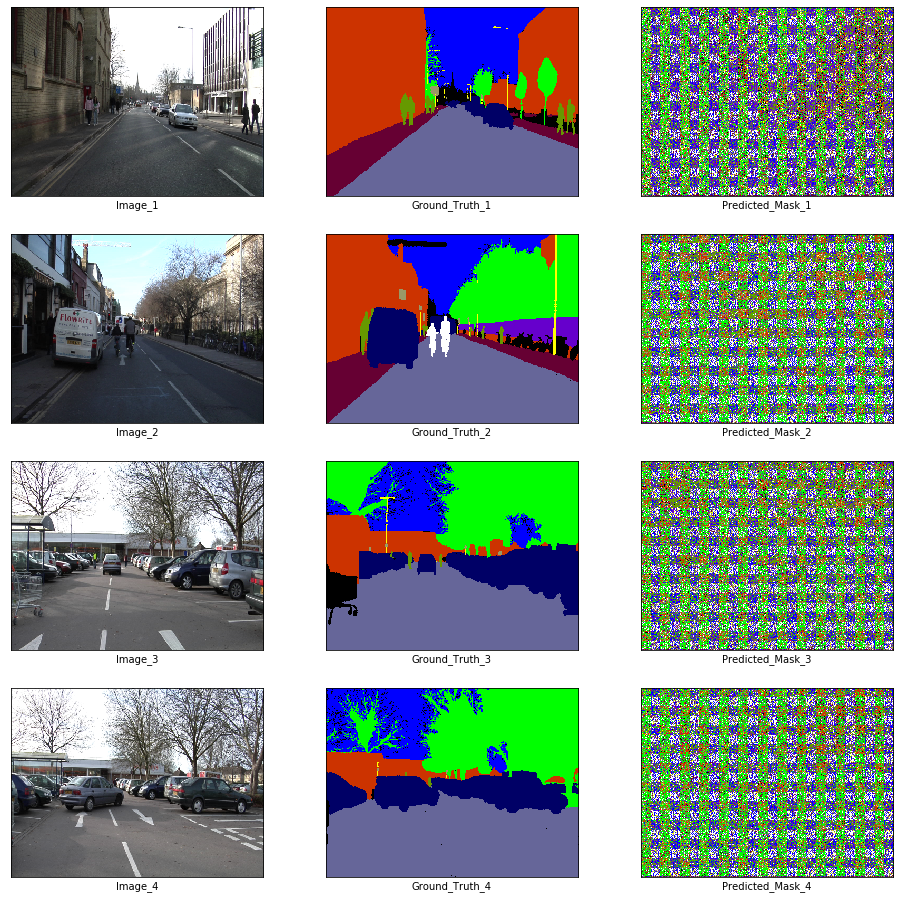

In [ ]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

## Training

In [ ]:
from torch.optim import Adam
from torch.nn import CrossEntropyLoss

The authors make use of a custom class weighing scheme defined as $w_{class} =   \frac{1}{ln(c + p_{class})}$, where `c` is an additional hyper-parameter set to `1.02`. The advantage of this weighing strategy is that in contrast to the inverse class probability weighing strategy, the weights are bounded as the probability approaches 0.

In [ ]:
def get_class_weights(loader, num_classes, c=1.02):
    _, y= next(iter(loader))
    y_flat = y.flatten()
    each_class = np.bincount(y_flat, minlength=num_classes)
    p_class = each_class / len(y_flat)
    return 1 / (np.log(c + p_class))

Now, we will set up the Criterion and Optimizer. The learning rate is set to `5e-4` with a weight decay of `2e-4` as mentioned in the paper.

In [ ]:
class_weights = get_class_weights(train_loader, 12)
criterion = CrossEntropyLoss(
    weight=torch.FloatTensor(class_weights).to(device)
)
optimizer = Adam(
    enet.parameters(),
    lr=5e-4,
    weight_decay=2e-4
)

Next, we implement the training procedure:

1. We first loop over the Main Training Loop for a particular number of epochs.
2. For each epoch, we loop over the dataset for a particular number of steps which is equal to `length of dataset // batch_size`. This is to ensure that the model gets a chance to look at most of the images in a single epoch.
3. In PyTorch, we need to set the gradients to zero before starting to do backpropragation because PyTorch accumulates the gradients on subsequent backward passes.
4. Perform Backpropagation.
5. Store the training loss.
6. Log the traning results (optional).
7. Perform Validation using the validation dataloader.
8. Log the validation results (optional).
9. Save the model states and results after several epochs (optional).

In [ ]:
def train(
	model, train_dataloader, val_dataloader,
	device, criterion, optimizer, train_step_size, val_step_size,
	visualize_every, save_every, save_location, save_prefix, epochs):
	# Make sure that the checkpoint location exists
	try:
		os.mkdir(save_location)
	except:
		pass
	train_loss_history, val_loss_history = [], []
	# Training
	for epoch in range(1, epochs + 1):
		print('Epoch {}\n'.format(epoch))
		# Training
		start = time()
		train_loss = 0
		model.train()
		# Step Loop
		for step in tqdm(range(train_step_size)):
			x_batch, y_batch = next(iter(train_dataloader))
			x_batch = x_batch.squeeze().to(device)
			y_batch = y_batch.squeeze().to(device)
			optimizer.zero_grad()
			out = model(x_batch.float())
			loss = criterion(out, y_batch.long())
			loss.backward()
			optimizer.step()
			train_loss += loss.item()
		train_loss_history.append(train_loss / train_step_size)
		print('\nTraining Loss: {}'.format(train_loss_history[-1]))
		print('Training Time: {} seconds'.format(time() - start))
		# Validation
		val_loss = 0
		model.eval()
		for step in tqdm(range(val_step_size)):
			x_val, y_val = next(iter(val_dataloader))
			x_val = x_val.squeeze().to(device)
			y_val = y_val.squeeze().to(device)
			out = model(x_val.float())
			out = out.data.max(1)[1]
			val_loss += (y_val.long() - out.long()).float().mean()
		val_loss_history.append(val_loss)
		print('\nValidation Loss: {}'.format(val_loss))
		# Visualization
		if epoch % visualize_every == 0:
			x_batch, y_batch = next(iter(train_loader))
			fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
			plt.setp(axes.flat, xticks = [], yticks = [])
			c = 1
			for i, ax in enumerate(axes.flat):
				if i % 3 == 0:
					ax.imshow(ToPILImage()(x_batch[c]))
					ax.set_xlabel('Image_' + str(c))
				elif i % 3 == 1:
					ax.imshow(decode_segmap(y_batch[c], color_dict))
					ax.set_xlabel('Ground_Truth_' + str(c))
				elif i % 3 == 2:
					ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
					ax.set_xlabel('Predicted_Mask_' + str(c))
					c += 1
			plt.show()
		# Checkpoints
		if epoch % save_every == 0:
			checkpoint = {
				'epoch' : epoch,
				'train_loss' : train_loss,
				'val_loss' : val_loss,
				'state_dict' : model.state_dict()
			}
			torch.save(
				checkpoint,
				'{}/{}-{}-{}-{}.pth'.format(
					save_location, save_prefix,
					epoch, train_loss, val_loss
				)
			)
			print('Checkpoint saved')
	print(
        '\nTraining Done.\nTraining Mean Loss: {:6f}\nValidation Mean Loss: {:6f}'.format(
            sum(train_loss_history) / epochs,
            sum(val_loss_history) / epochs
        )
    )
	return train_loss_history, val_loss_history

  0%|          | 0/36 [00:00<?, ?it/s]

Epoch 1



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.3736738430129156
Training Time: 36.622546672821045 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 2.495696544647217
Epoch 2



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.066100193394555
Training Time: 37.32582426071167 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 1.0354421138763428
Epoch 3



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.819241699245241
Training Time: 37.225857734680176 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.462801933288574
Epoch 4



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.6384391950236425
Training Time: 37.67400813102722 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.796051502227783
Epoch 5



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.5421283278200362
Training Time: 37.320696115493774 seconds


100%|██████████| 10/10 [00:07<00:00,  1.26it/s]


Validation Loss: -4.719521522521973


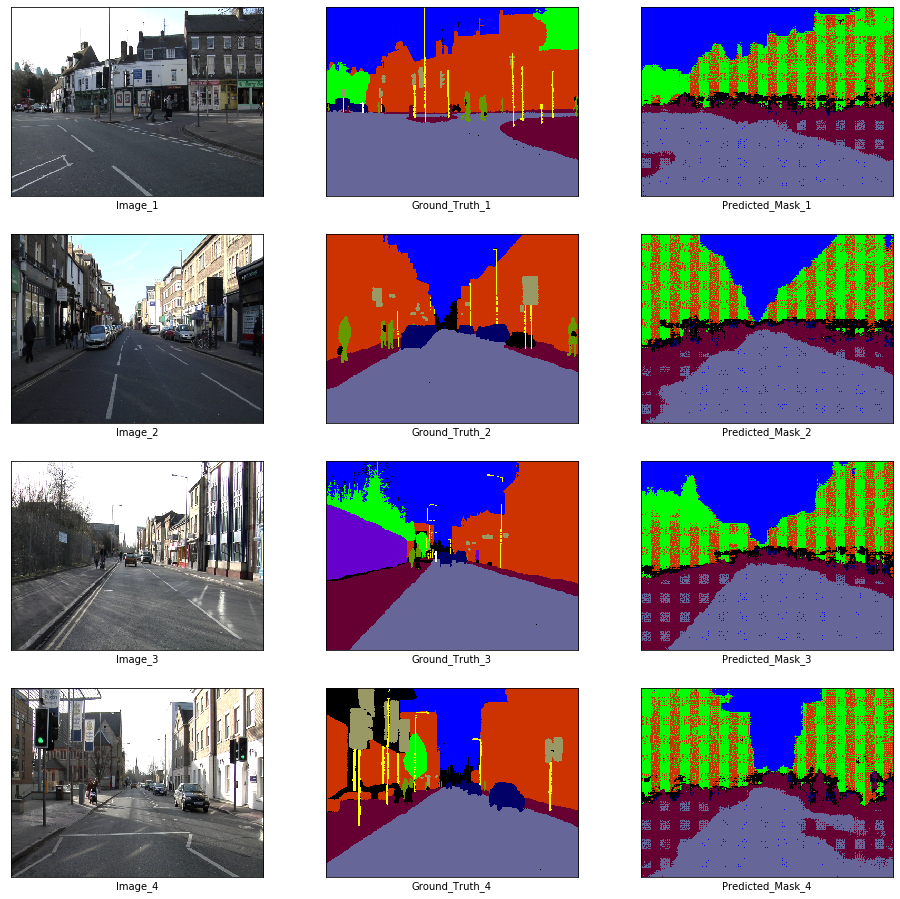

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 6



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.4267812801731958
Training Time: 36.2429084777832 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.382036209106445
Epoch 7



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.3556759390566084
Training Time: 37.677775144577026 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.395351886749268
Epoch 8



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.3103740215301514
Training Time: 37.39039158821106 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.370512008666992
Epoch 9



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2682642042636871
Training Time: 37.26855731010437 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -8.429301261901855
Epoch 10



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2029826508627997
Training Time: 37.28497934341431 seconds


100%|██████████| 10/10 [00:07<00:00,  1.26it/s]


Validation Loss: -6.792354106903076


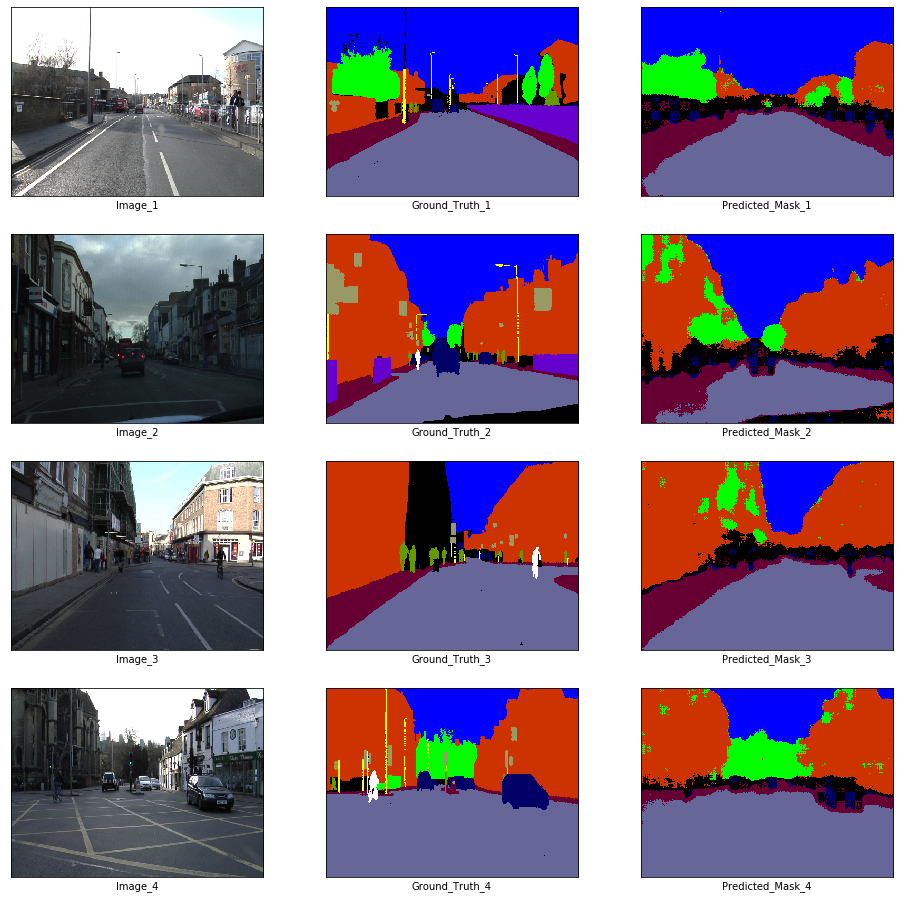

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 11



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1570831570360396
Training Time: 37.477909326553345 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.195928573608398
Epoch 12



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1395491758982341
Training Time: 37.90213441848755 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.173197269439697
Epoch 13



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1266514195336237
Training Time: 37.404568910598755 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.771578311920166
Epoch 14



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0894614275958803
Training Time: 37.46945667266846 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.576180934906006
Epoch 15



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0793888171513875
Training Time: 36.50749087333679 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: -6.073637962341309


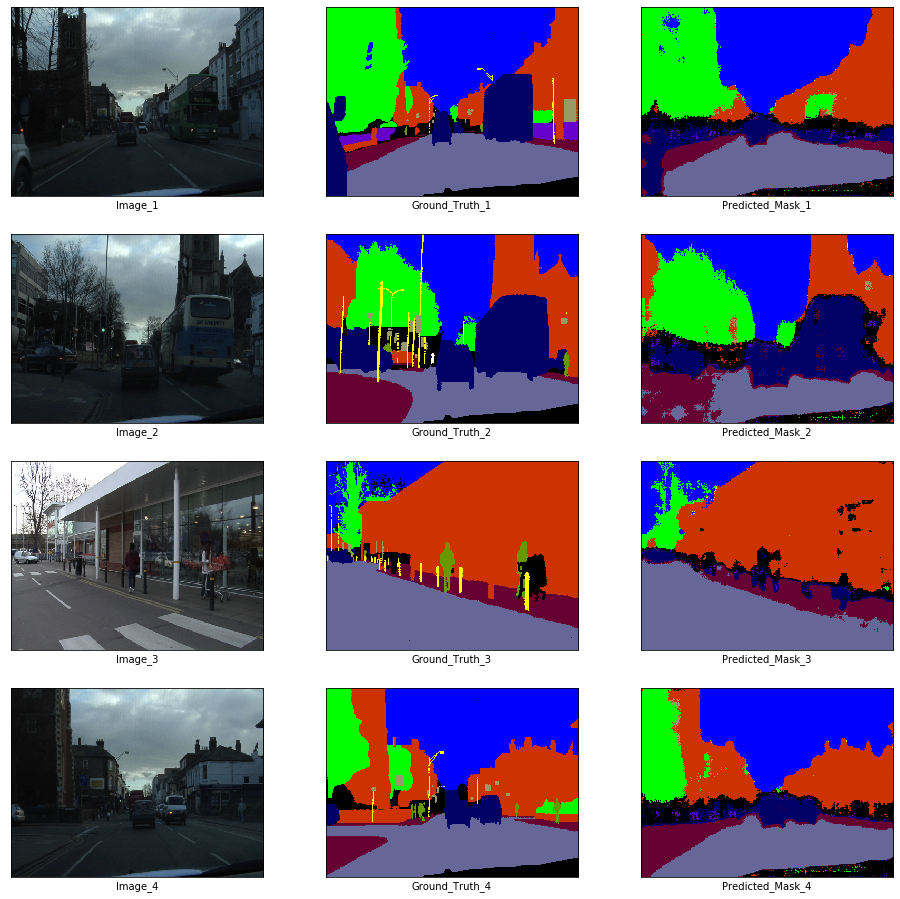

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 16



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0256218943330977
Training Time: 37.52659511566162 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -8.707944869995117
Epoch 17



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0208994067377515
Training Time: 37.60098838806152 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.784101963043213
Epoch 18



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.00802077849706
Training Time: 37.67285490036011 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -8.1976957321167
Epoch 19



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9760349442561468
Training Time: 37.02203035354614 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.932909965515137
Epoch 20



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9686084638039271
Training Time: 36.49009346961975 seconds


100%|██████████| 10/10 [00:07<00:00,  1.28it/s]


Validation Loss: -10.035560607910156


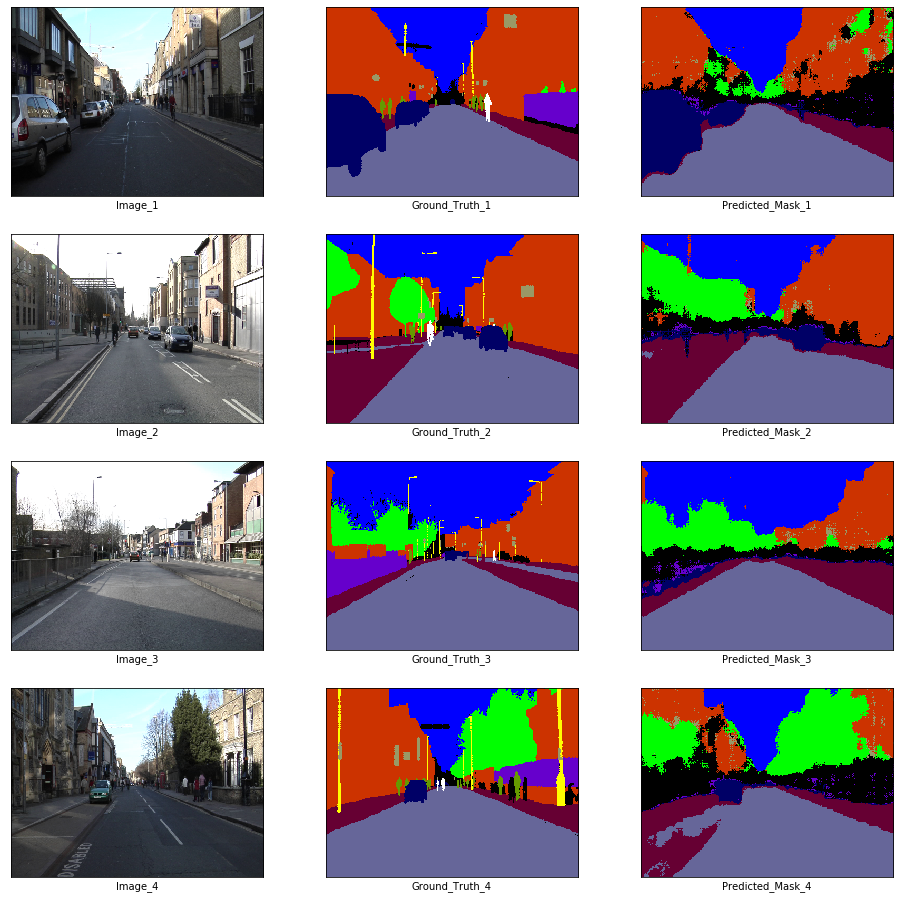

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 21



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9232347259918848
Training Time: 36.40699481964111 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.618765830993652
Epoch 22



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9214804338084327
Training Time: 37.64718818664551 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.437498569488525
Epoch 23



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8775700446632173
Training Time: 36.491459608078 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.585930824279785
Epoch 24



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8676599446270201
Training Time: 37.75159788131714 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.8291826248168945
Epoch 25



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8542953348822064
Training Time: 38.35563540458679 seconds


100%|██████████| 10/10 [00:07<00:00,  1.25it/s]


Validation Loss: -10.226922988891602


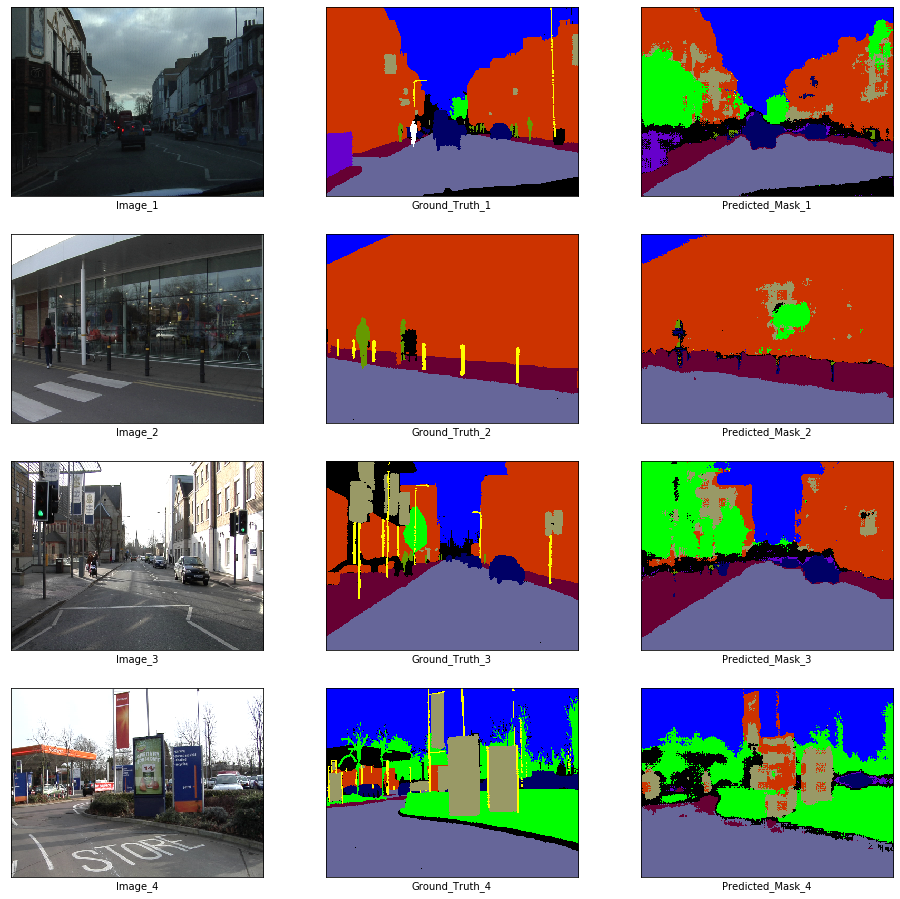

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 26



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8472818914386961
Training Time: 36.00928783416748 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -8.36304759979248
Epoch 27



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.821869295504358
Training Time: 36.77352595329285 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -9.58829402923584
Epoch 28



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7889702585008409
Training Time: 38.61393928527832 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.412705421447754
Epoch 29



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7545491208632787
Training Time: 38.38607335090637 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -8.005655288696289
Epoch 30



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7702976332770454
Training Time: 36.71100616455078 seconds


100%|██████████| 10/10 [00:08<00:00,  1.24it/s]


Validation Loss: -4.231881141662598


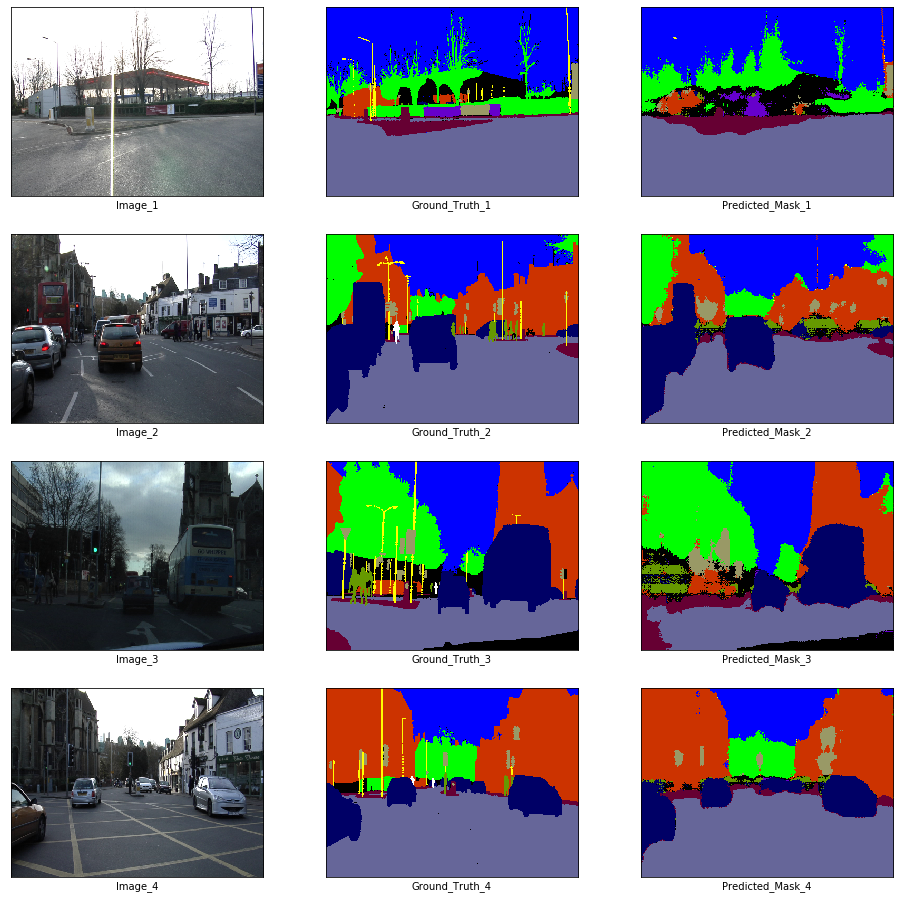

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 31



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7379177262385687
Training Time: 35.90049076080322 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.388115406036377
Epoch 32



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7093521191014184
Training Time: 37.23017859458923 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.115187168121338
Epoch 33



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6929942336347368
Training Time: 38.1418399810791 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.854228496551514
Epoch 34



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6660703635878034
Training Time: 38.218461751937866 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.8958330154418945
Epoch 35



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6632857289579179
Training Time: 37.43135929107666 seconds


100%|██████████| 10/10 [00:08<00:00,  1.23it/s]


Validation Loss: -5.267255783081055


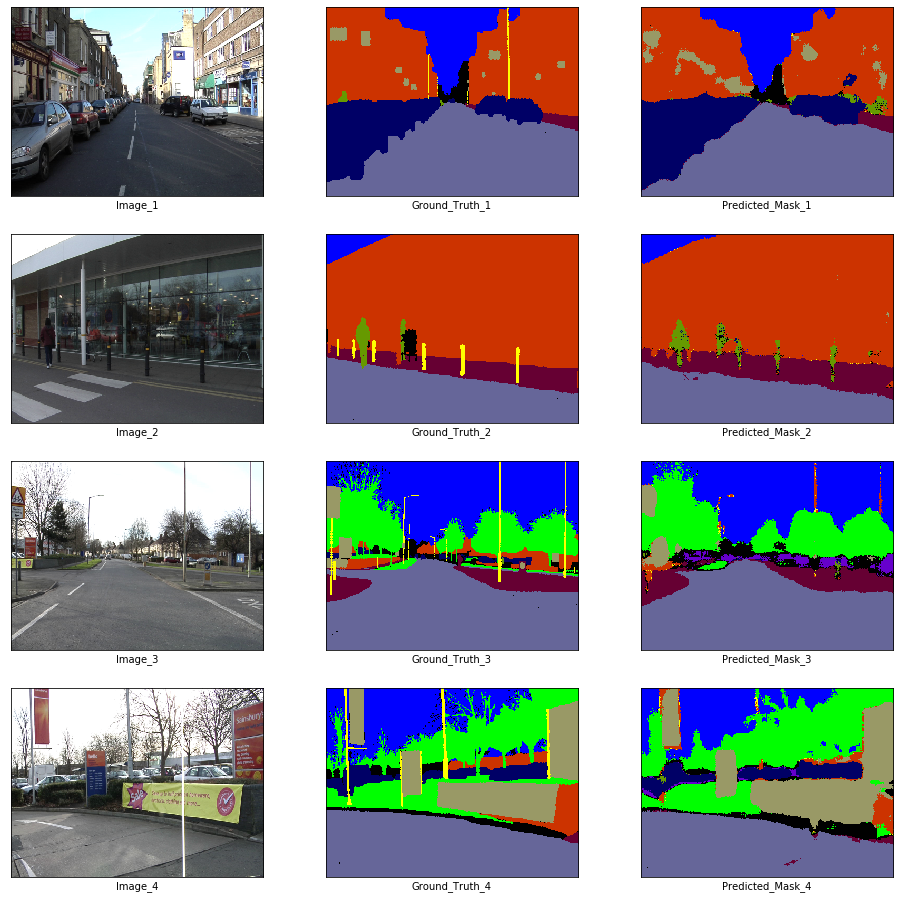

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 36



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6700823141468896
Training Time: 39.75525879859924 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.932151794433594
Epoch 37



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6306778772009743
Training Time: 37.12487030029297 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.434138774871826
Epoch 38



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6451671355300479
Training Time: 36.77497148513794 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.195463180541992
Epoch 39



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6210144890679253
Training Time: 37.950018882751465 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.6000566482543945
Epoch 40



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6190666158994039
Training Time: 38.053221702575684 seconds


100%|██████████| 10/10 [00:08<00:00,  1.21it/s]


Validation Loss: -5.544920444488525


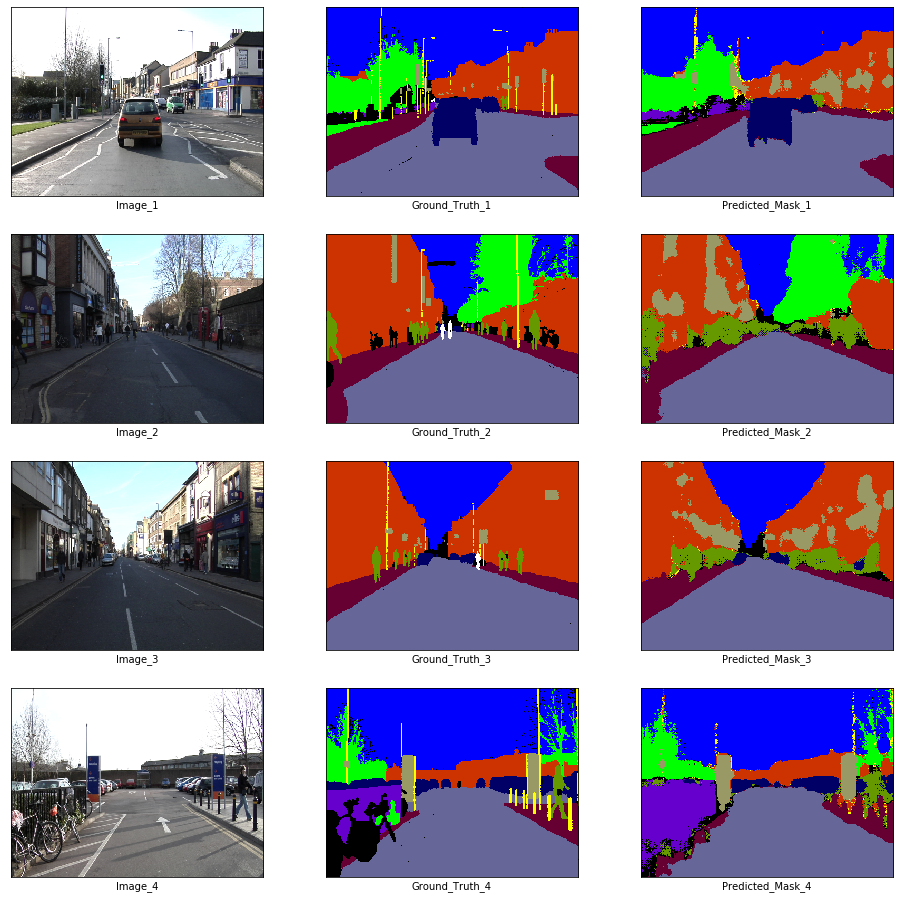

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 41



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5928388577368524
Training Time: 37.63972759246826 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.879909992218018
Epoch 42



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5870317411091592
Training Time: 37.024226903915405 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.742264270782471
Epoch 43



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5675398872958289
Training Time: 37.81453609466553 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.535061359405518
Epoch 44



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5501133882337146
Training Time: 36.879273414611816 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.253548622131348
Epoch 45



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5503247496154573
Training Time: 37.58225345611572 seconds


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Validation Loss: -5.902456283569336


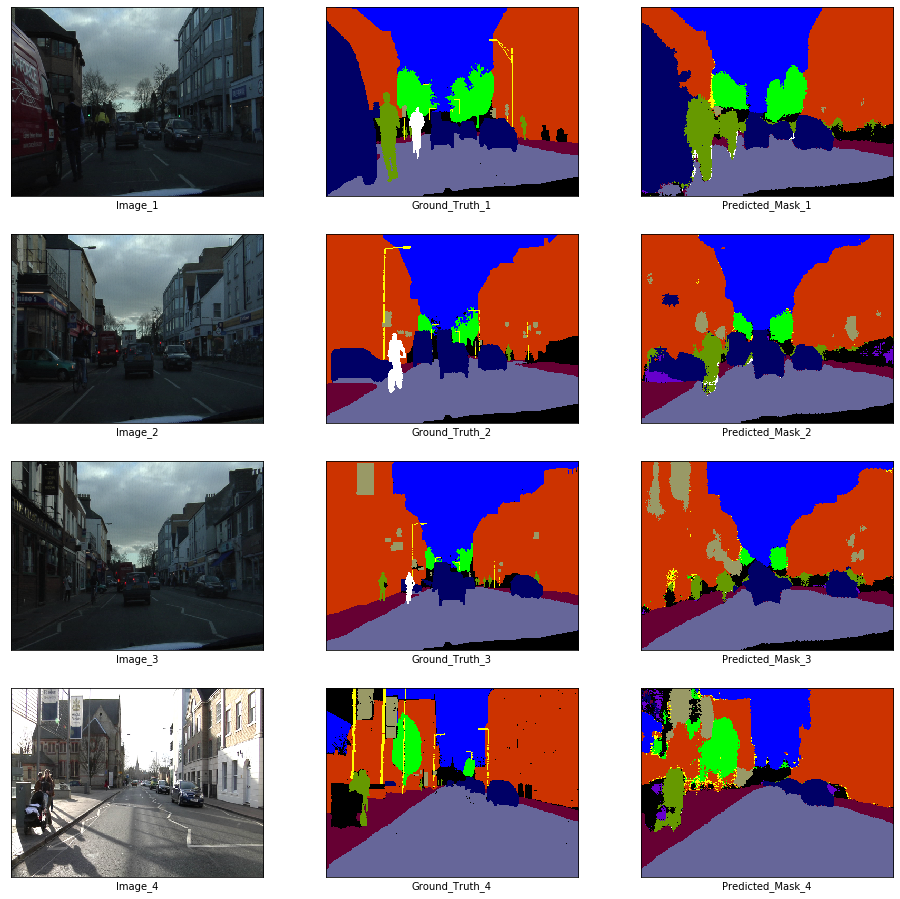

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 46



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5512463673949242
Training Time: 36.606677532196045 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.735024452209473
Epoch 47



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.544807703130775
Training Time: 38.517911434173584 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.34906005859375
Epoch 48



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5279948107070394
Training Time: 36.94304895401001 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.252256393432617
Epoch 49



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5191673007276323
Training Time: 37.99461269378662 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.820833206176758
Epoch 50



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.49875519176324207
Training Time: 39.174588203430176 seconds


100%|██████████| 10/10 [00:07<00:00,  1.27it/s]


Validation Loss: -4.738555431365967


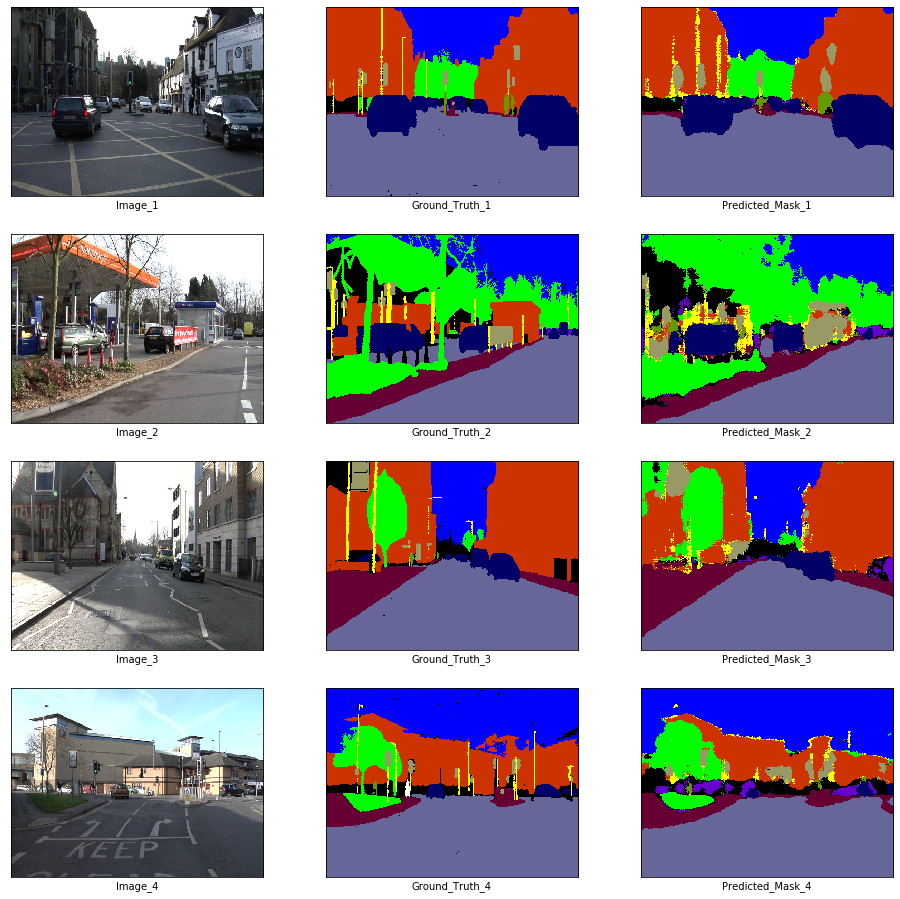

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 51



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5172228713830312
Training Time: 37.38908004760742 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.111539840698242
Epoch 52



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5180092445678182
Training Time: 37.96890068054199 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.410361289978027
Epoch 53



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5053947452041838
Training Time: 38.50911474227905 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.627304553985596
Epoch 54



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4888179575403531
Training Time: 38.64139103889465 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.422050952911377
Epoch 55



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4791935044858191
Training Time: 37.589763879776 seconds


100%|██████████| 10/10 [00:08<00:00,  1.18it/s]


Validation Loss: -5.576418876647949


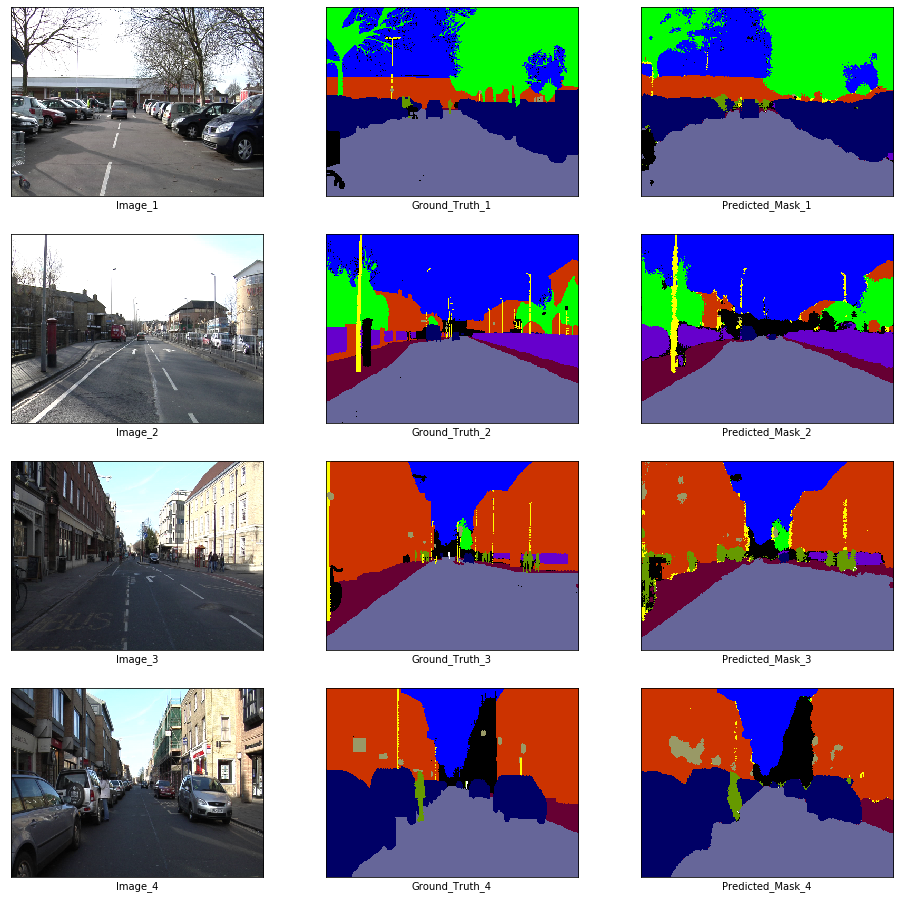

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 56



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.45455337150229347
Training Time: 40.3157172203064 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.987201690673828
Epoch 57



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4661391567852762
Training Time: 36.715943336486816 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.632068157196045
Epoch 58



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4665369697742992
Training Time: 36.19537806510925 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.786327838897705
Epoch 59



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.45907818608813816
Training Time: 38.01468300819397 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.478023529052734
Epoch 60



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4500412220756213
Training Time: 37.21549987792969 seconds


100%|██████████| 10/10 [00:07<00:00,  1.27it/s]


Validation Loss: -5.177182674407959


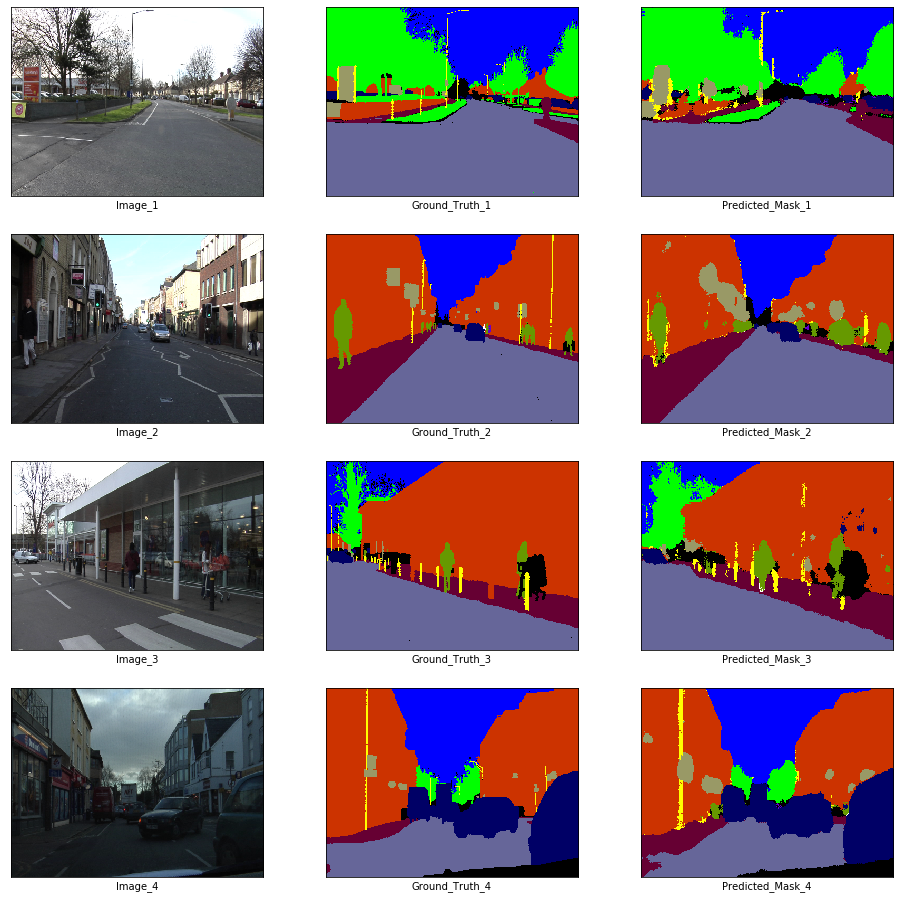

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 61



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.45753948307699627
Training Time: 38.74998998641968 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.799277305603027
Epoch 62



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.42691650407181847
Training Time: 37.344823598861694 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.130724906921387
Epoch 63



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4300544717245632
Training Time: 37.420971632003784 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.042947769165039
Epoch 64



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.42879077792167664
Training Time: 37.66694641113281 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.180288314819336
Epoch 65



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4272735383775499
Training Time: 37.58568787574768 seconds


100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


Validation Loss: -4.429321765899658


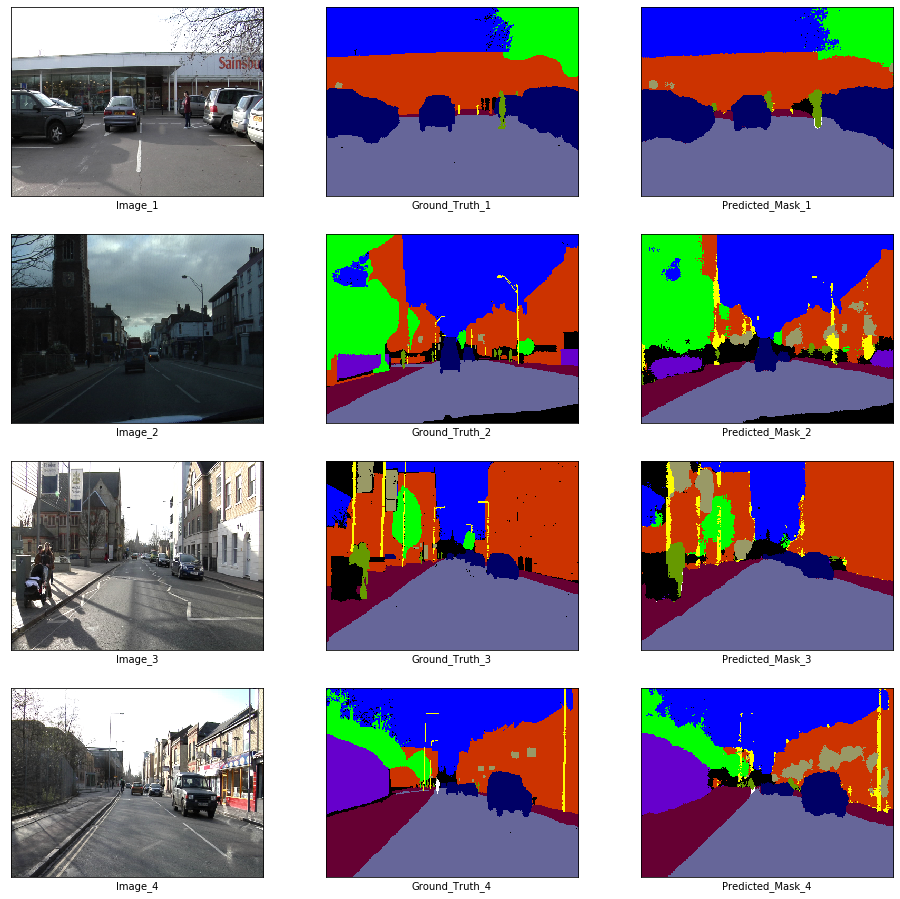

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 66



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.42417974604500663
Training Time: 37.05702567100525 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.533682346343994
Epoch 67



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4159412756562233
Training Time: 37.56980299949646 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.018970012664795
Epoch 68



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4148317939705319
Training Time: 37.138564348220825 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.9047155380249023
Epoch 69



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3963303491473198
Training Time: 37.7933931350708 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.635763168334961
Epoch 70



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.40438303930891883
Training Time: 37.2310631275177 seconds


100%|██████████| 10/10 [00:08<00:00,  1.16it/s]


Validation Loss: -4.414734363555908


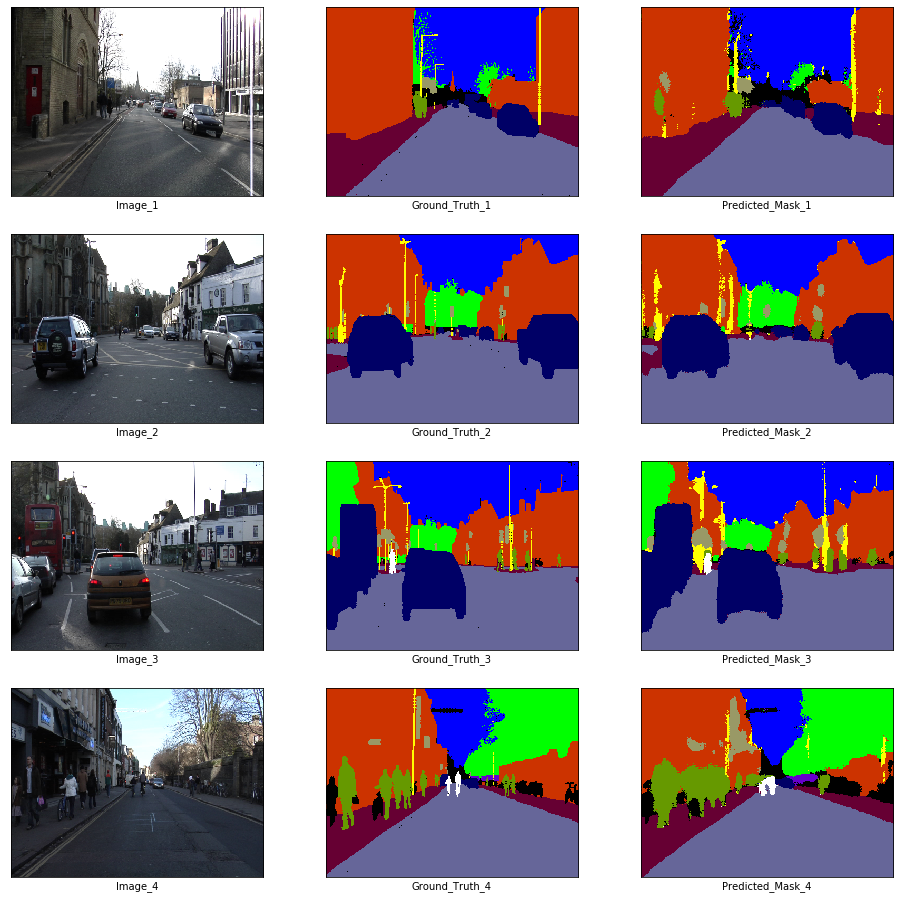

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 71



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.39953534967369503
Training Time: 36.96225690841675 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.7862653732299805
Epoch 72



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.39342257877190906
Training Time: 38.77004361152649 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.276852130889893
Epoch 73



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3897610389524036
Training Time: 38.38589859008789 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.030964374542236
Epoch 74



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.405379969212744
Training Time: 36.81379222869873 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.7940850257873535
Epoch 75



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.377888491584195
Training Time: 37.3532612323761 seconds


100%|██████████| 10/10 [00:08<00:00,  1.14it/s]


Validation Loss: -3.9622135162353516


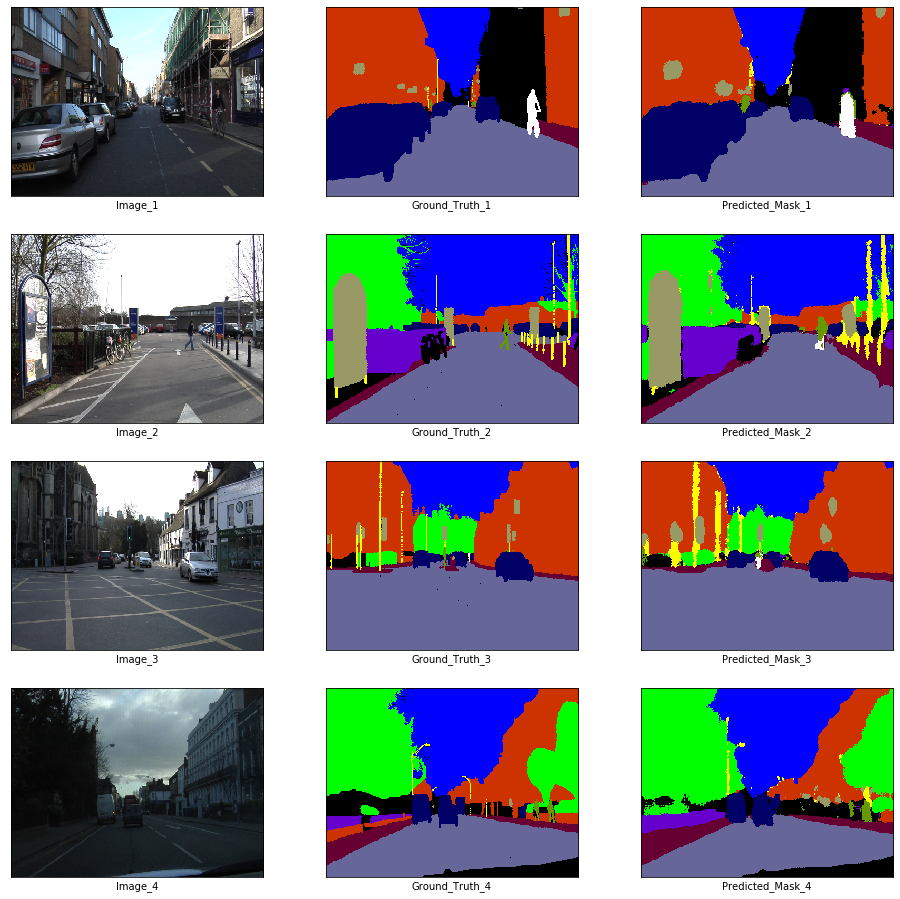

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 76



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.37682998263173634
Training Time: 36.6818642616272 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.148308753967285
Epoch 77



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.371006368762917
Training Time: 38.503026723861694 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.861609935760498
Epoch 78



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3602796254886521
Training Time: 38.01511263847351 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.9753198623657227
Epoch 79



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3653753134939406
Training Time: 37.917211055755615 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.8377439975738525
Epoch 80



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.37505776186784107
Training Time: 38.310165882110596 seconds


100%|██████████| 10/10 [00:08<00:00,  1.18it/s]


Validation Loss: -5.334249973297119


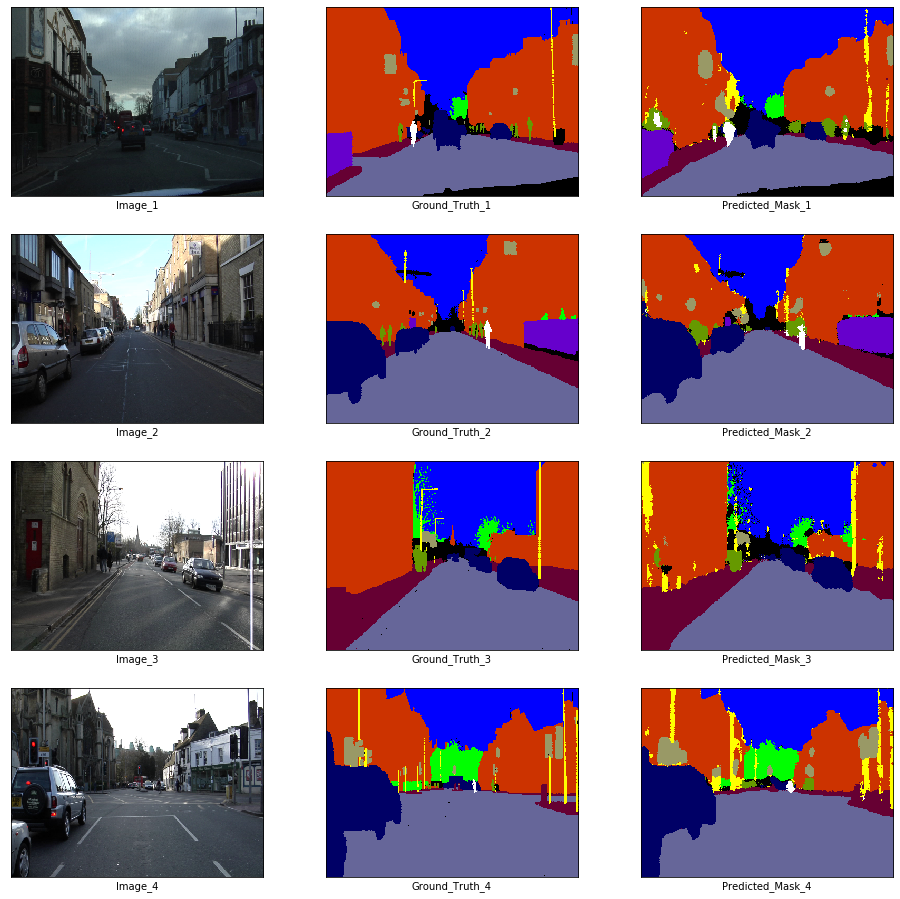

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 81



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36951222353511387
Training Time: 38.20164632797241 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.66939640045166
Epoch 82



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35576848520172966
Training Time: 37.462151527404785 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.722535610198975
Epoch 83



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36002279900842243
Training Time: 37.20385551452637 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.74808406829834
Epoch 84



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3489703999625312
Training Time: 38.138071060180664 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.982658386230469
Epoch 85



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34990982214609784
Training Time: 37.759665727615356 seconds


100%|██████████| 10/10 [00:07<00:00,  1.28it/s]


Validation Loss: -4.157069683074951


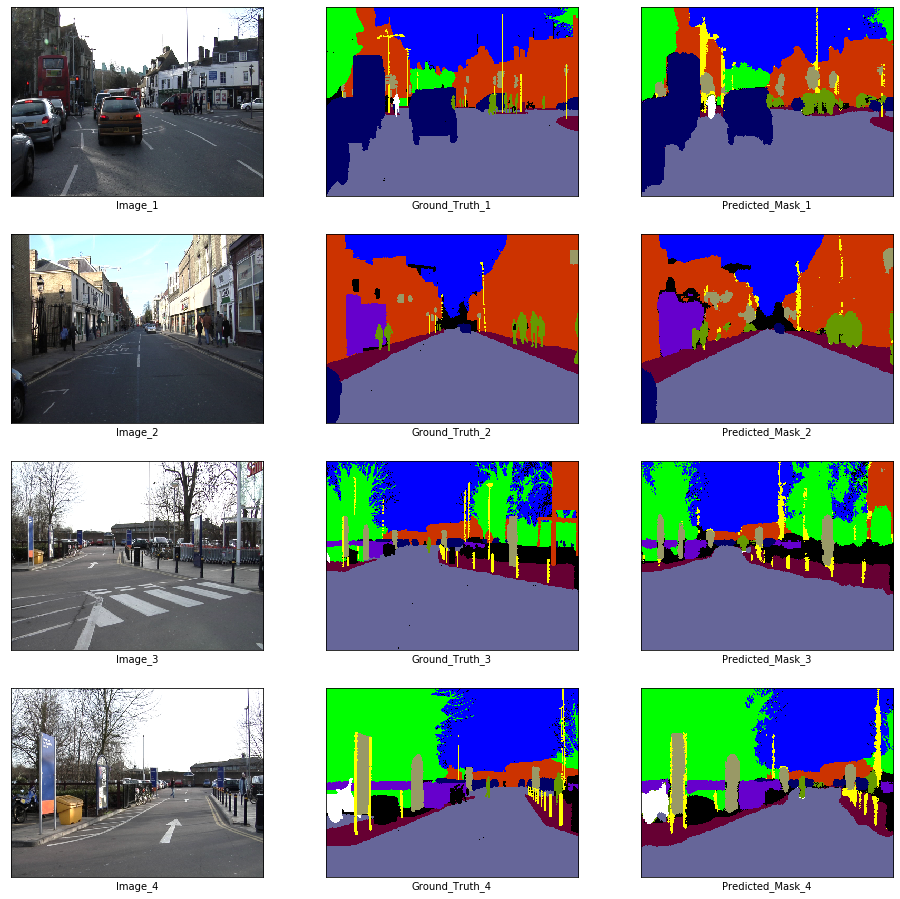

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 86



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35239921179082656
Training Time: 37.88401412963867 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.5902533531188965
Epoch 87



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34805963353978264
Training Time: 37.58679533004761 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.319746971130371
Epoch 88



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3448881424135632
Training Time: 37.084150552749634 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.250303268432617
Epoch 89



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3393386834197574
Training Time: 38.44252109527588 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.880829334259033
Epoch 90



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3295273143384192
Training Time: 37.59496545791626 seconds


100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


Validation Loss: -4.594930648803711


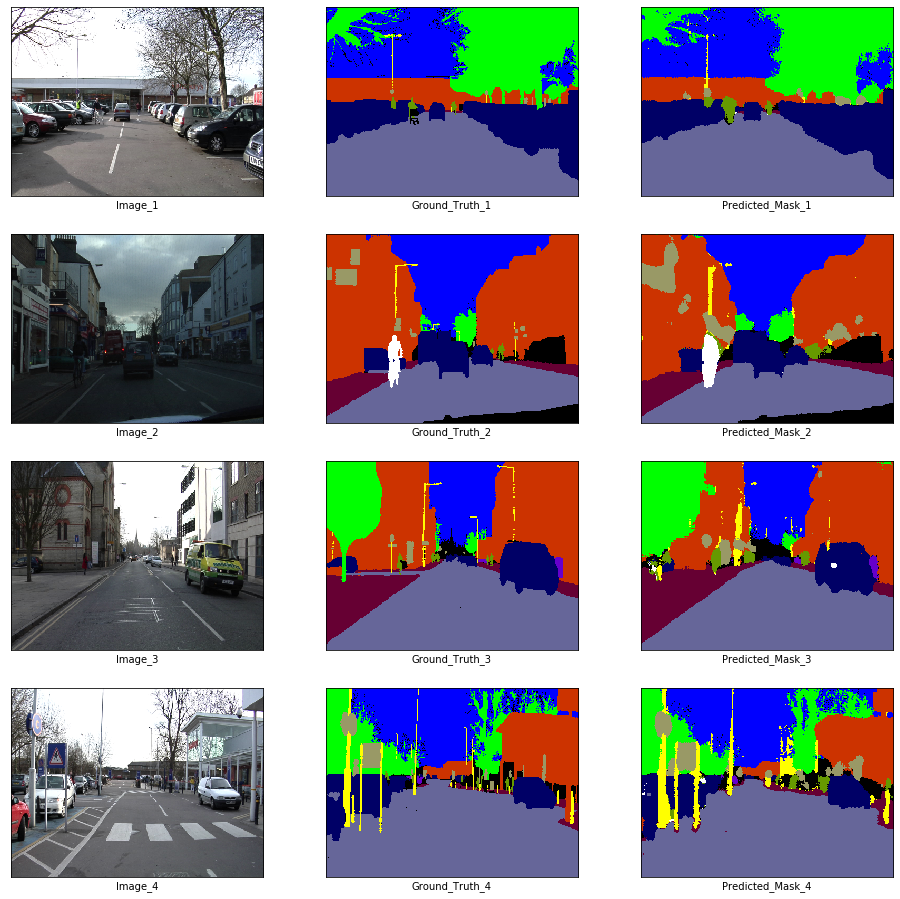

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 91



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3464961921175321
Training Time: 36.96203589439392 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.407609224319458
Epoch 92



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.34060925907558864
Training Time: 38.37405014038086 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.496046543121338
Epoch 93



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3336273547675874
Training Time: 36.53633213043213 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.9917984008789062
Epoch 94



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3360065817832947
Training Time: 37.400681495666504 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.259033679962158
Epoch 95



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33179697228802574
Training Time: 37.88106441497803 seconds


100%|██████████| 10/10 [00:08<00:00,  1.15it/s]


Validation Loss: -6.045409202575684


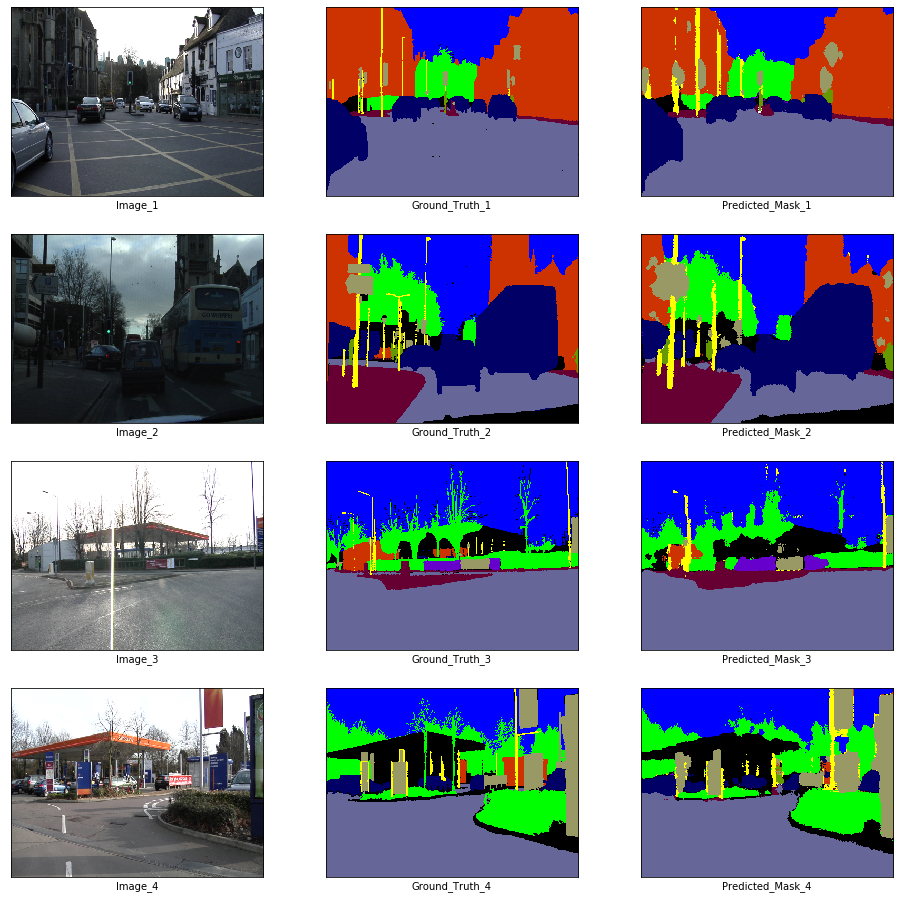

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 96



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.329134587612417
Training Time: 38.55759382247925 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.940917015075684
Epoch 97



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3220530201991399
Training Time: 37.08751201629639 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.636651992797852
Epoch 98



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.31848980320824516
Training Time: 37.68484568595886 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.7739005088806152
Epoch 99



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.32071789933575523
Training Time: 37.38284635543823 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3696560859680176
Epoch 100



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3072536442842748
Training Time: 36.655545473098755 seconds


100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


Validation Loss: -3.19159197807312


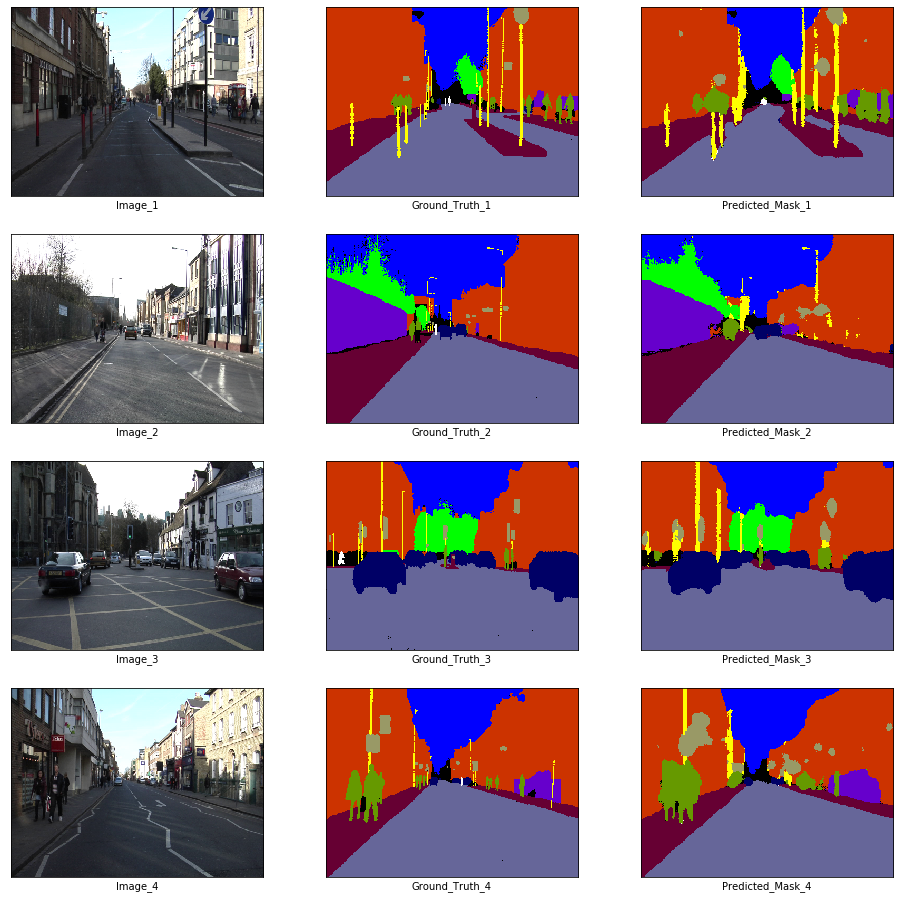

Checkpoint saved

Training Done.
Training Mean Loss: 0.667980
Validation Mean Loss: -5.383368


In [ ]:
train_loss_history, val_loss_history = train(
    enet, train_loader, val_loader,
    device, criterion, optimizer,
    len(train_images) // batch_size,
    len(val_images) // batch_size, 5,
    5, './checkpoints', 'enet-model', 100
)

Now, let us visualize the results...

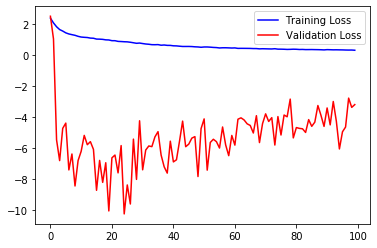

In [ ]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.plot(val_loss_history, color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

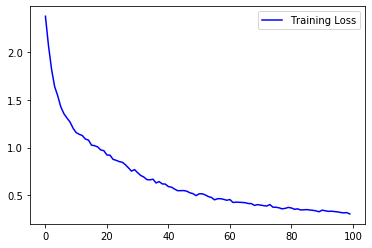

In [ ]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.legend()
plt.show()

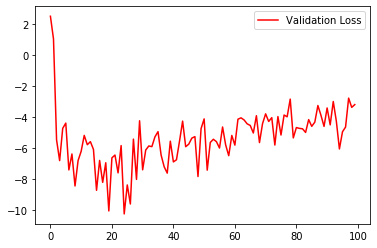

In [ ]:
plt.plot(val_loss_history, color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

## Prediction

We will be predicting with the weights at epoch 65 where both training and validation loss seems to be stable. This is done in order to avoid overfitting.

In [ ]:
state_dict = torch.load('./checkpoints/enet-model-65-14.726004391908646--3.9436190128326416.pth')['state_dict']
enet.load_state_dict(state_dict)

<All keys matched successfully>

Prediction on Training Data

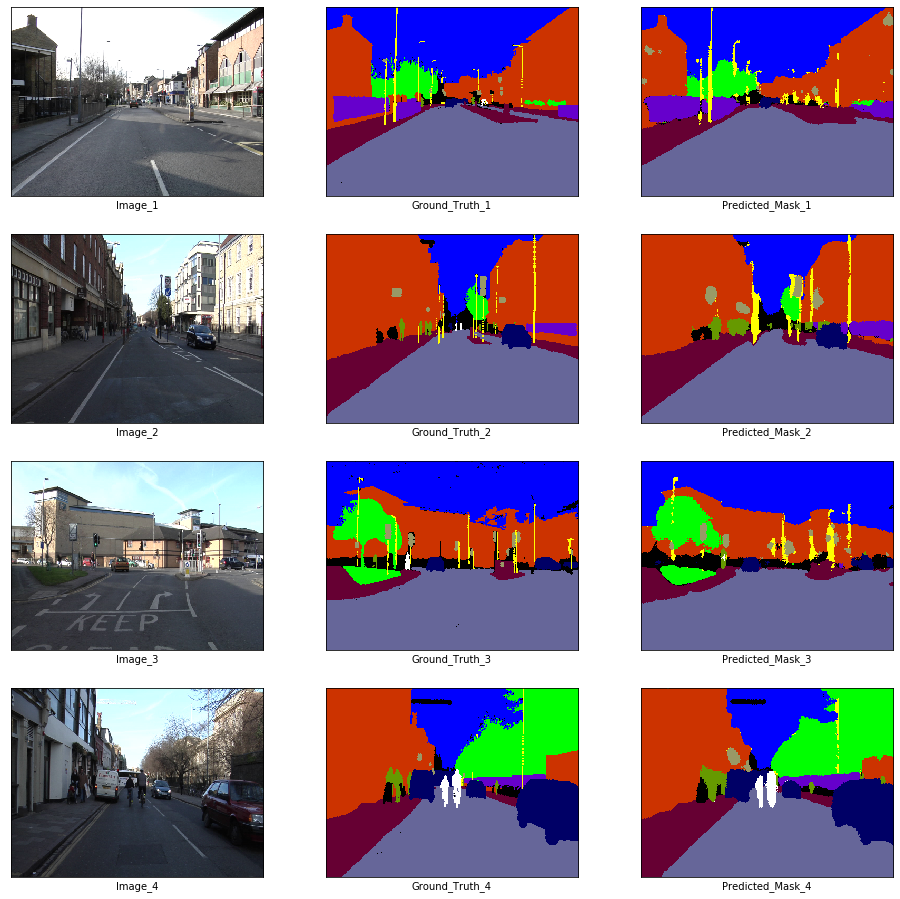

In [ ]:
x_batch, y_batch = next(iter(train_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

Prediction on Validation Data

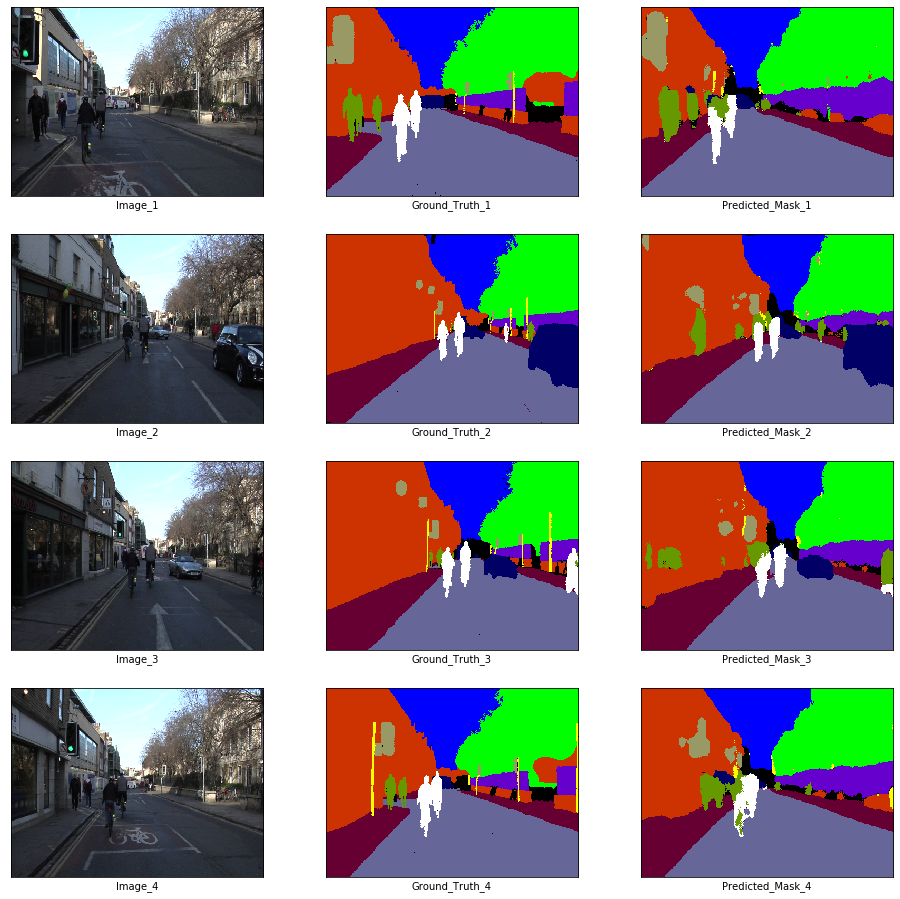

In [ ]:
x_batch, y_batch = next(iter(val_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()